# Análisis y Modelado Predictivo

En este notebook, se recopilarán y unirán todos los archivos CSV previamente generados para realizar un análisis completo de los datos. Posteriormente, se desarrollará un modelo predictivo utilizando la información consolidada.

In [ ]:
!pip install pyodbc dotenv

In [28]:
import pyodbc
import pandas as pd
import os
from dotenv import load_dotenv
# Cargar variables de entorno desde archivo .env si existe
load_dotenv()

# Obtener las credenciales desde las variables de entorno
server = os.getenv('DB_SERVER')
username = os.getenv('DB_USERNAME')
password = os.getenv('DB_PASSWORD')
database = os.getenv('DB_DATABASE')

# Usamos autenticación interactiva con cuenta Microsoft
conn_str = (
    f'DRIVER={{ODBC Driver 18 for SQL Server}};'
    f'SERVER={server};'
    f'DATABASE={database};'
    f'UID={username};'
    f'PWD={password};'
    'Encrypt=yes;TrustServerCertificate=yes;Connection Timeout=30;'
)

In [29]:
# Consulta para obtener los datos sin la cabecera por defecto
query = """
SELECT * FROM dbo.booking
"""
try:
    # Establecer conexión
    conn = pyodbc.connect(conn_str)
    # Leer datos en un DataFrame de pandas
    df_booking = pd.read_sql(query, conn)
    # Mostrar las primeras filas del DataFrame
    df_booking.columns = df_booking.iloc[0]
    df_booking = df_booking.drop(df_booking.index[0]) 
    print(df_booking.head())
except pyodbc.Error as e:
    print("Error al conectar a la base de datos:", e)
finally:
    # Cerrar la conexión
    if 'conn' in locals():
        conn.close()
        print("Conexión cerrada.")
    else:
        print("No se estableció conexión.")
  

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_5904\3611720716.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_booking = pd.read_sql(query, conn)


0                              hotel cancelado regimen canal_distribucion  \
1                    gran hotel bali         0      bb             direct   
2                    gran hotel bali         0      bb          corporate   
3                    gran hotel bali         0      bb              ta/to   
4  eurostars hotel de la reconquista         0      bb              ta/to   
5                   parador de cádiz         0      bb             direct   

0  tipo_cliente cliente_recurrente reservas_previas_no_canceladas adultos  \
1       jóvenes                  0                              0       1   
2       jóvenes                  0                              0       1   
3  tercera edad                  0                              0       2   
4        pareja                  0                              0       2   
5        pareja                  0                              0       2   

0 ninos hombres  ... fecha_llegada fecha_salida dias_reserva  \
1     0   

In [30]:
# Consulta para obtener los datos sin la cabecera por defecto
query = """
SELECT * FROM dbo.review
"""
try:
    # Establecer conexión
    conn = pyodbc.connect(conn_str)
    # Leer datos en un DataFrame de pandas
    df_review = pd.read_sql(query, conn)
    # Mostrar las primeras filas del DataFrame
    df_review.columns = df_review.iloc[0]
    df_review = df_review.drop(df_review.index[0]) 
    print(df_review.head())
except pyodbc.Error as e:
    print("Error al conectar a la base de datos:", e)
finally:
    # Cerrar la conexión
    if 'conn' in locals():
        conn.close()
        print("Conexión cerrada.")
    else:
        print("No se estableció conexión.")

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_5904\2953871945.py:9: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_review = pd.read_sql(query, conn)


0                                               text sentiment
1  pleasant 10 min walk along the sea front to th...  positive
2  really lovely hotel stayed on the very top flo...  positive
3  ett mycket bra hotell det som drog ner betyget...  positive
4  we stayed here for four nights in october the ...  positive
5  we loved staying on the island of lido you nee...  positive
Conexión cerrada.


In [31]:
df_booking.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118675 entries, 1 to 118675
Data columns (total 28 columns):
 #   Column                          Non-Null Count   Dtype 
---  ------                          --------------   ----- 
 0   hotel                           118675 non-null  object
 1   cancelado                       118675 non-null  object
 2   regimen                         118675 non-null  object
 3   canal_distribucion              118675 non-null  object
 4   tipo_cliente                    118675 non-null  object
 5   cliente_recurrente              118675 non-null  object
 6   reservas_previas_no_canceladas  118675 non-null  object
 7   adultos                         118675 non-null  object
 8   ninos                           118675 non-null  object
 9   hombres                         118675 non-null  object
 10  mujeres                         118675 non-null  object
 11  edad_18-30                      118675 non-null  object
 12  edad_31-50                    

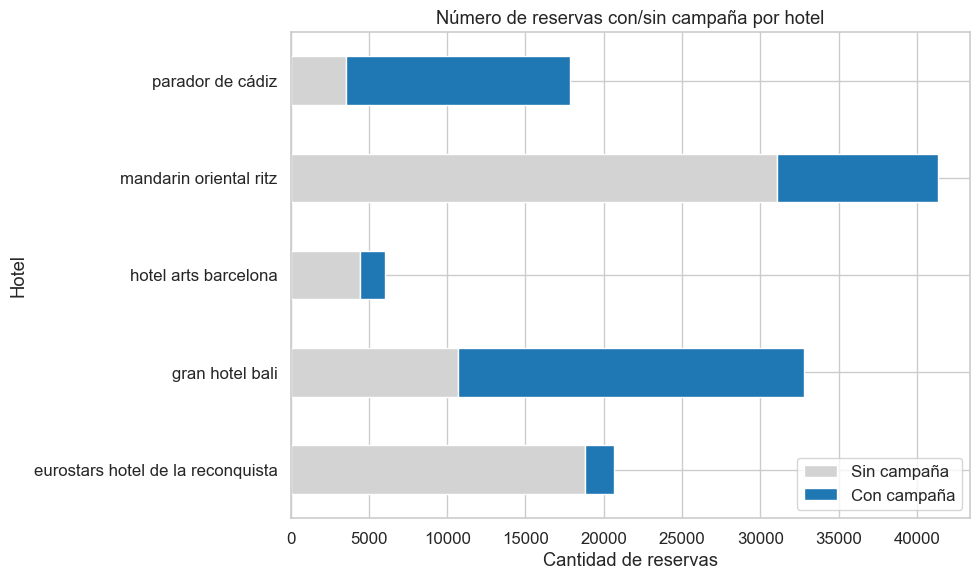

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

# Crear columna auxiliar
df_booking['tiene_campaña'] = df_booking['campaña_asignada'].notna()

# Agrupar
conteo = df_booking.groupby(['hotel', 'tiene_campaña']).size().reset_index(name='cuenta')

# Pivotar para gráfico
pivot = conteo.pivot(index='hotel', columns='tiene_campaña', values='cuenta').fillna(0)
pivot.columns = ['Sin campaña', 'Con campaña']

# Gráfico apilado
pivot.plot(kind='barh', stacked=True, figsize=(10, 6), color=['#d3d3d3', '#1f77b4'])
plt.title("Número de reservas con/sin campaña por hotel")
plt.xlabel("Cantidad de reservas")
plt.ylabel("Hotel")
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()


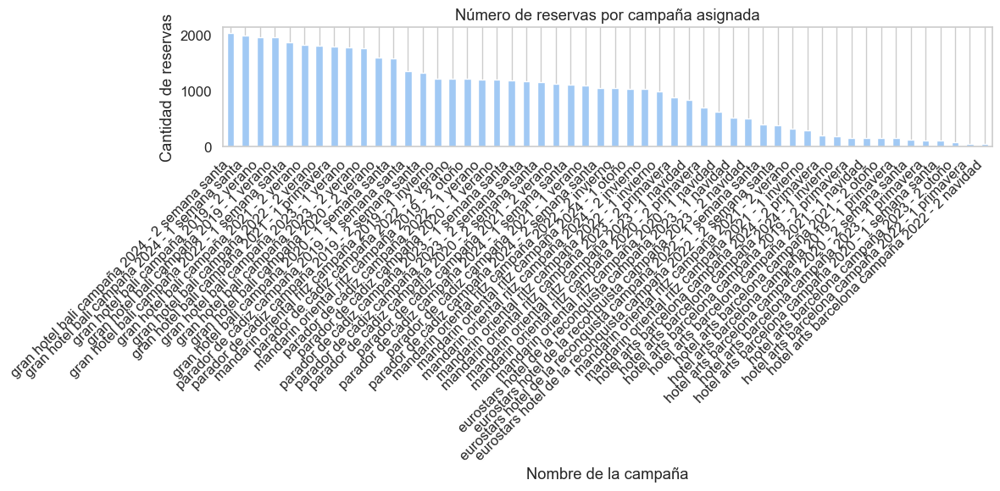

In [33]:
import matplotlib.pyplot as plt
 
# Contar cuántas reservas se asignaron a cada campaña
campaña_counts = df_booking['campaña_asignada'].value_counts().sort_values(ascending=False)
 
# Crear gráfico de barras
plt.figure(figsize=(12, 6))
campaña_counts.plot(kind='bar')
 
plt.title('Número de reservas por campaña asignada')
plt.xlabel('Nombre de la campaña')
plt.ylabel('Cantidad de reservas')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_5904\1285049596.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


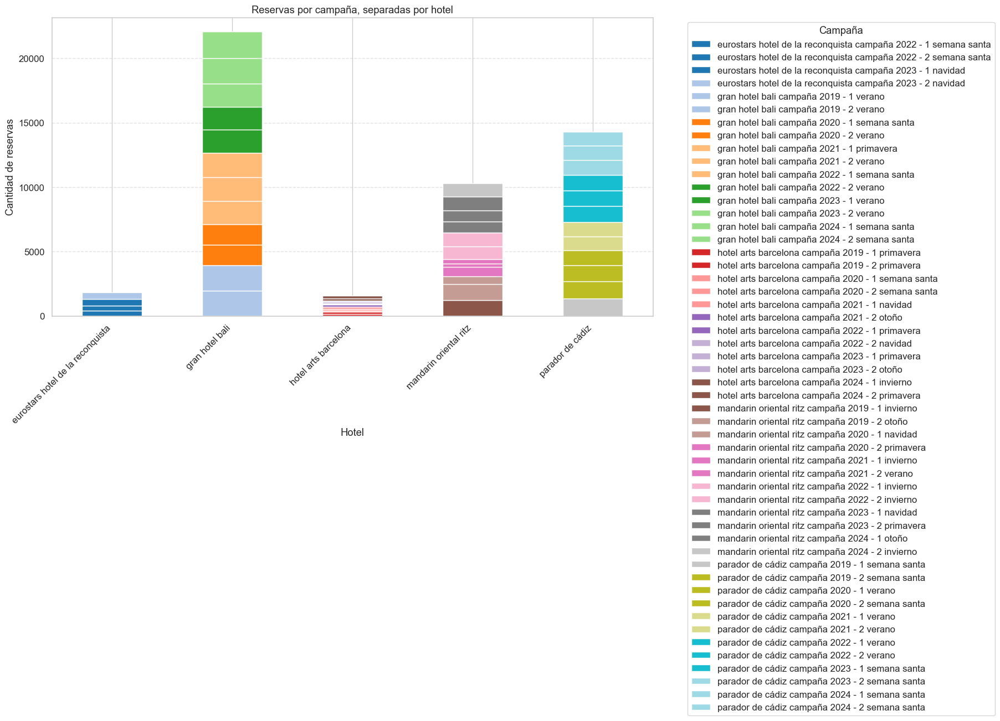

In [34]:
import matplotlib.pyplot as plt
 
# Filtrar solo las reservas con campañas asignadas
df_con_campaña = df_booking[df_booking['campaña_asignada'].notna()]
 
# Agrupar por hotel y campaña
reservas_hotel_campaña = (
    df_con_campaña.groupby(['hotel', 'campaña_asignada'])
    .size()
    .unstack(fill_value=0)
)
 
# Crear gráfico apilado
reservas_hotel_campaña.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 7),
    colormap='tab20'
)
 
plt.title('Reservas por campaña, separadas por hotel')
plt.xlabel('Hotel')
plt.ylabel('Cantidad de reservas')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Campaña', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.6)
 
plt.show()

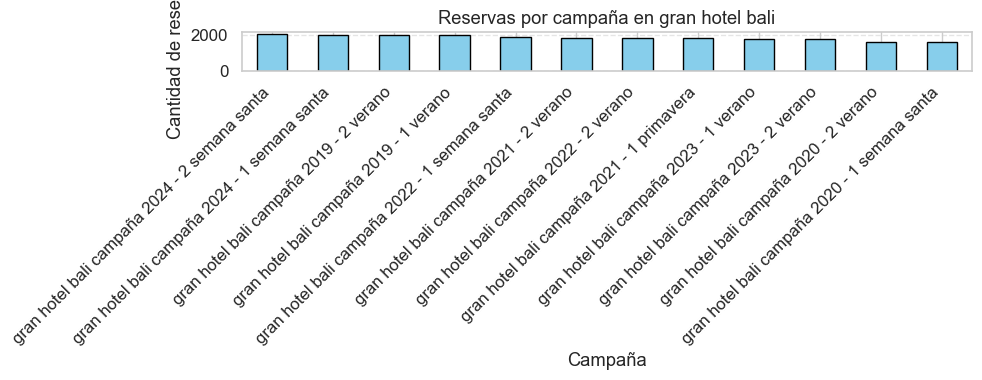

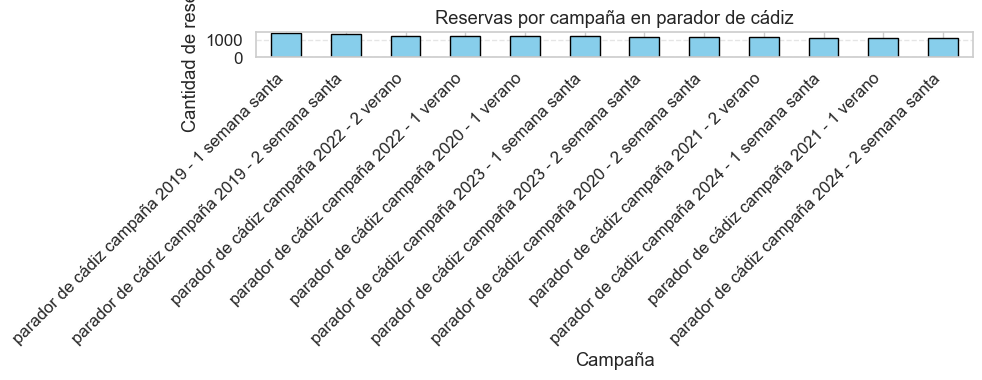

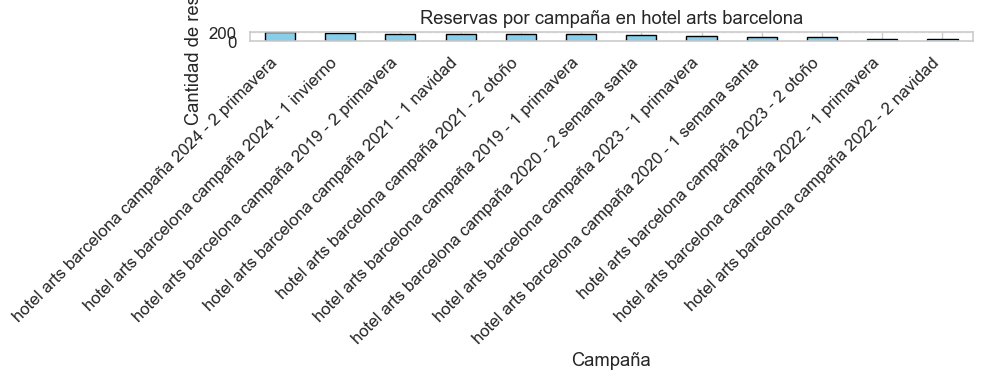

C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_5904\2150417541.py:21: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


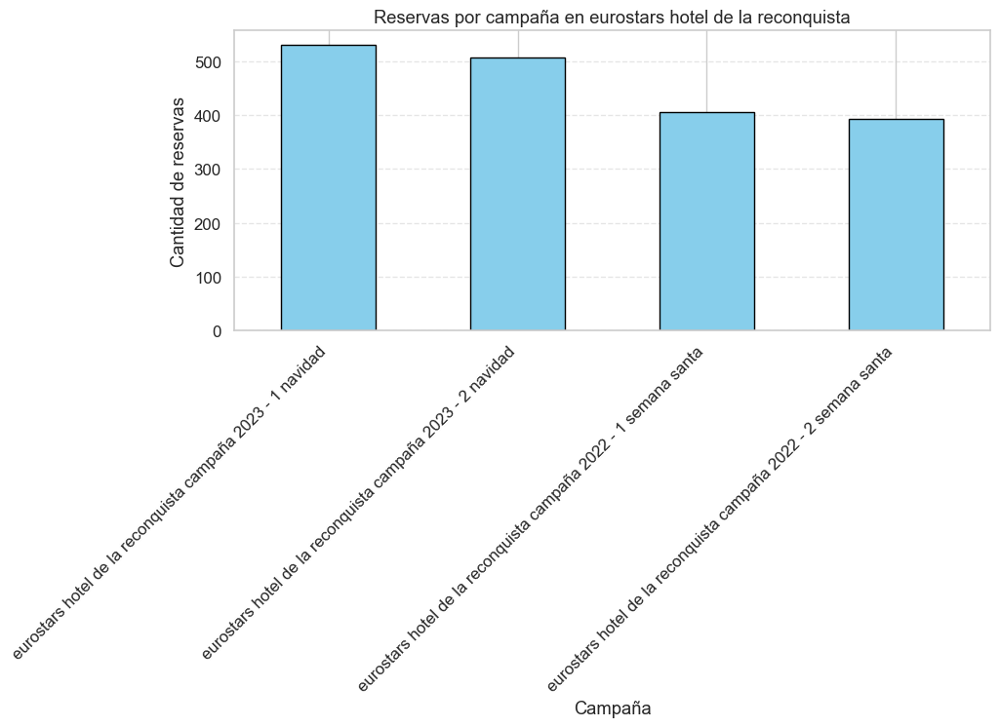

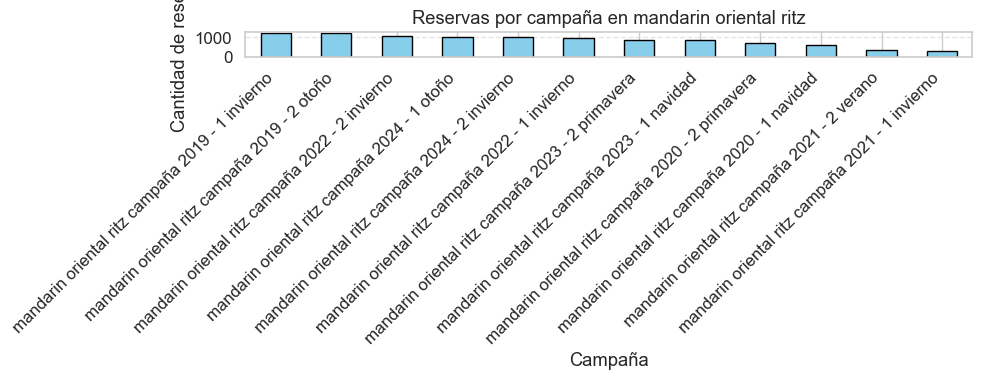

In [35]:
import matplotlib.pyplot as plt
 
# Filtrar reservas que tienen campaña asignada
df_con_campaña = df_booking[df_booking['campaña_asignada'].notna()]
 
# Obtener la lista única de hoteles con campañas
hoteles = df_con_campaña['hotel'].unique()
 
# Crear una gráfica individual por hotel
for hotel in hoteles:
    df_hotel = df_con_campaña[df_con_campaña['hotel'] == hotel]
    conteo = df_hotel['campaña_asignada'].value_counts().sort_values(ascending=False)
   
    plt.figure(figsize=(10, 4))
    conteo.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title(f'Reservas por campaña en {hotel}')
    plt.xlabel('Campaña')
    plt.ylabel('Cantidad de reservas')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()
 

## Distribuir las reviews
Distribuir las reviews con sus sentiemientos dependiendo el hotel

In [38]:
# Asegura formatos y limpieza
df_booking['hotel'] = df_booking['hotel'].str.strip().str.lower()
df_booking['fecha_llegada'] = pd.to_datetime(df_booking['fecha_llegada'], errors='coerce')
df_review['sentiment'] = df_review['sentiment'].str.lower()


positivas = df_review[df_review['sentiment'] == 'positive']
negativas = df_review[df_review['sentiment'] == 'negative']

# Count reviews by hotel
print("Cantidad de reseñas positivas por hotel:", len(positivas))
print("Cantidad de reseñas negativas por hotel:", len(negativas))


Cantidad de reseñas positivas por hotel: 52155
Cantidad de reseñas negativas por hotel: 47419


In [40]:
# El número representa el procentaje de reseñas positivas
reglas_por_hotel = {
    "parador de cádiz": {
        2019: 0.90,
        2020: 0.80,
        2021: 0.76,
        2022: 0.81,
        2023: 0.79,
        2024: 0.75,
    },
    "eurostars hotel de la reconquista": {
        2019: 0.30,
        2020: 0.39,
        2021: 0.32,
        2022: 0.22,
        2023: 0.23,
        2024: 0.34,
    },
    "gran hotel bali": {
        2019: 0.70,
        2020: 0.76,
        2021: 0.67,
        2022: 0.70,
        2023: 0.75,
        2024: 0.75,
    },
    "mandarin oriental ritz": {
        2019: 0.35,
        2020: 0.20,
        2021: 0.30,
        2022: 0.30,
        2023: 0.45,
        2024: 0.30,
    },
    "hotel arts barcelona": {
        2019: 0.30,
        2020: 0.23,
        2021: 0.32,
        2022: 0.42,
        2023: 0.32,
        2024: 0.40,
    },
}


In [41]:
import numpy as np

def asignar_review(row):
    global positivas, negativas  # Para modificar los DataFrames globales
    hotel = row['hotel']
    year = row['fecha_llegada'].year

    probabilidad = reglas_por_hotel.get(hotel, {}).get(year, 0.5)  # Default: 50% positivo
    random_value = np.random.rand()

    if random_value < probabilidad and not positivas.empty:
        review = positivas.sample(1)
        idx = review.index[0]
        review_row = review.iloc[0]
        positivas = positivas.drop(idx)
    elif not negativas.empty:
        review = negativas.sample(1)
        idx = review.index[0]
        review_row = review.iloc[0]
        negativas = negativas.drop(idx)
    else:
        return pd.Series({'text': None, 'sentiment': None})

    return pd.Series({
        'text': review_row['text'],
        'sentiment': review_row['sentiment']
    })


In [42]:
df_booking[['review_text', 'review_sentiment']] = df_booking.apply(asignar_review, axis=1)
df_booking.head()

,hotel,cancelado,regimen,canal_distribucion,tipo_cliente,cliente_recurrente,reservas_previas_no_canceladas,adultos,ninos,hombres,...,plazas_aparcamiento,ubicación,campaña_asignada,lanzamiento_inicio,lanzamiento_fin,fecha_inicio,fecha_fin,tiene_campaña,review_text,review_sentiment
1,gran hotel bali,0,bb,direct,jóvenes,0,0,1,0,1,...,0,benidorm,None,None,None,None,None,False,un servicio excelente comida muy buena y varia...,positive
2,gran hotel bali,0,bb,corporate,jóvenes,0,0,1,0,1,...,0,benidorm,gran hotel bali campaña 2023 - 2 verano,2023-05-02,2023-05-30,2023-06-28,2023-07-25,True,hoy es nuestra ltima noche de 12 noches la exp...,positive
3,gran hotel bali,0,bb,ta/to,tercera edad,0,0,2,0,1,...,0,benidorm,gran hotel bali campaña 2020 - 1 semana santa,2020-03-08,2020-03-18,2020-03-28,2020-04-14,True,the size of the room and the cleanliness,negative
4,eurostars hotel de la reconquista,0,bb,ta/to,pareja,0,0,2,0,1,...,0,asturias,None,None,None,None,None,False,a nice and relaxing visit you pay a little mor...,positive
5,parador de cádiz,0,bb,direct,pareja,0,0,2,0,1,...,0,cádiz,None,None,None,None,None,False,cool boutique hotel i really enjoyed my stay h...,positive


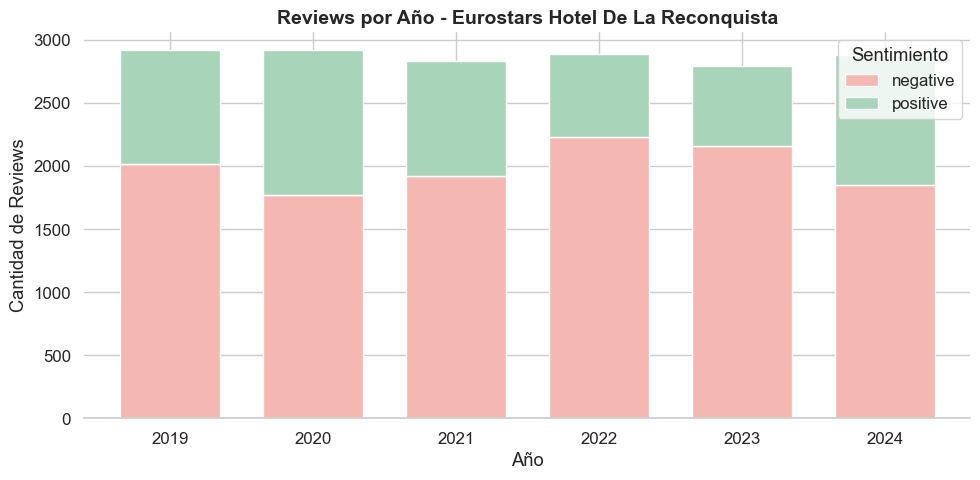

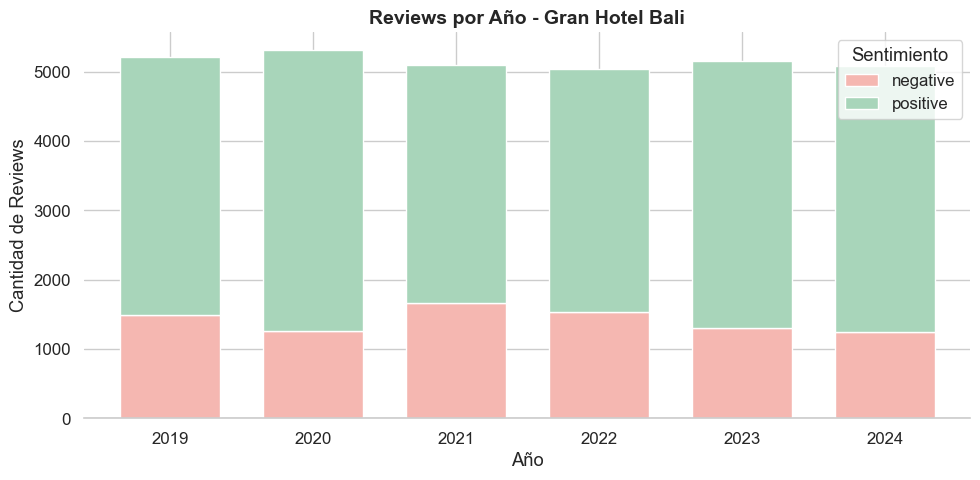

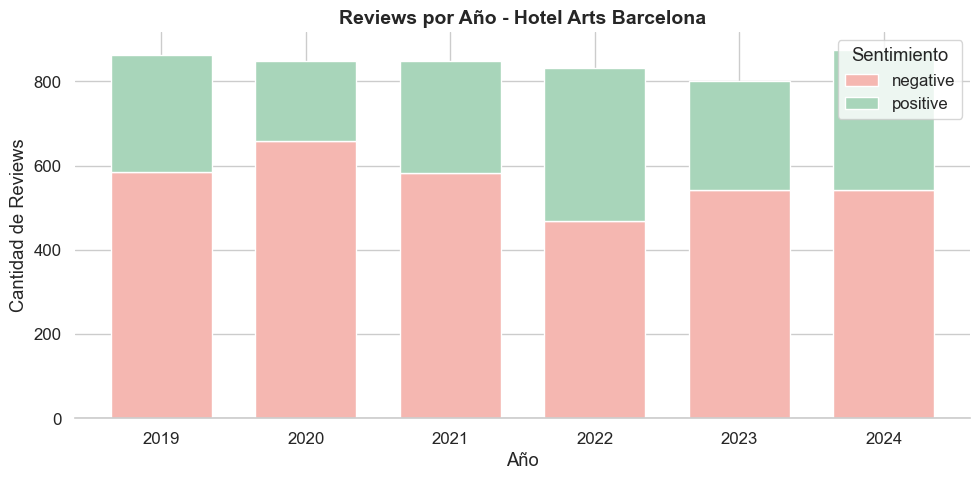

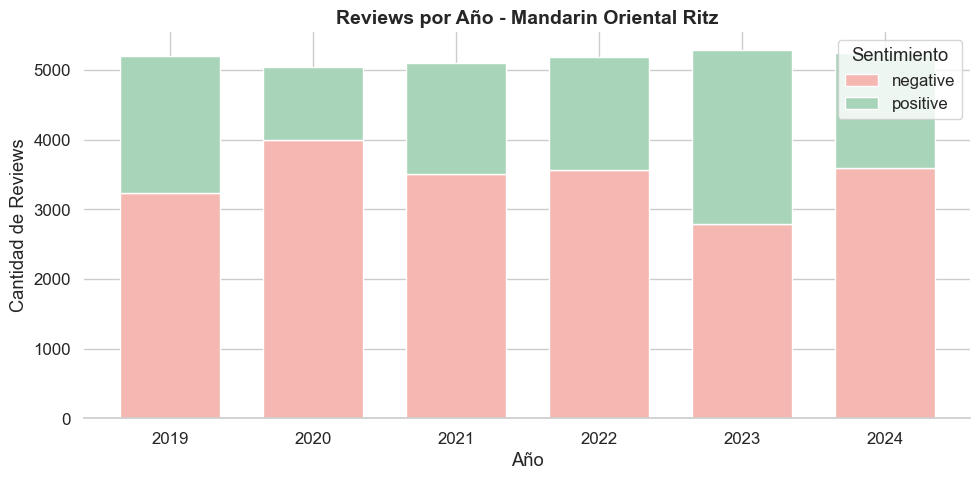

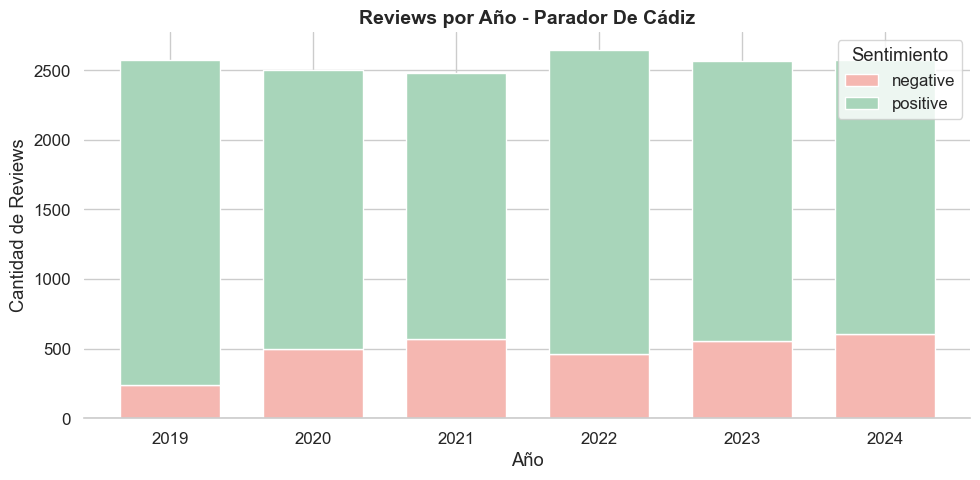

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Estilo más bonito
sns.set(style="whitegrid", palette="pastel", font_scale=1.1)
plt.rcParams['axes.edgecolor'] = '#cccccc'
plt.rcParams['axes.linewidth'] = 1.2

# Asegurarse que las columnas están en minúsculas y tipo correcto
df_booking['hotel'] = df_booking['hotel'].str.lower()
df_booking['año'] = df_booking['fecha_llegada'].dt.year

# Agrupar
resumen = (
    df_booking
    .groupby(['hotel', 'año', 'review_sentiment'])
    .size()
    .reset_index(name='conteo')
)

# Obtener hoteles únicos
hoteles = sorted(resumen['hotel'].unique())

# Colores suaves
colores = {'positive': '#A8D5BA', 'negative': '#F5B7B1'}  # Verde tenue y rojo salmón

# Una gráfica por hotel
for hotel in hoteles:
    datos = resumen[resumen['hotel'] == hotel]
    pivot = datos.pivot(index='año', columns='review_sentiment', values='conteo').fillna(0)

    # Plot
    plt.figure(figsize=(10, 5))
    pivot[['negative', 'positive']].plot(
        kind='bar',
        stacked=True,
        color=[colores.get(col, '#ccc') for col in pivot.columns],
        edgecolor='white',
        width=0.7,
        ax=plt.gca()
    )

    plt.title(f"Reviews por Año - {hotel.title()}", fontsize=14, weight='bold')
    plt.xlabel("Año")
    plt.ylabel("Cantidad de Reviews")
    plt.xticks(rotation=0)
    plt.legend(title='Sentimiento')
    sns.despine(left=True)
    plt.tight_layout()
    plt.show()


In [ ]:
!pip install nltk wordcloud matplotlib pandas deepl

In [45]:
# Importar bibliotecas
import nltk
import pandas as pd
from nltk.corpus import stopwords
from googletrans import Translator
from wordcloud import WordCloud
import matplotlib.pyplot as plt


import deepl
import os
from dotenv import load_dotenv

load_dotenv()

# Configurar autenticación de DeepL

auth_key = os.getenv("DEEPL_API_KEY")
translator = deepl.Translator(auth_key)

# Descargar stopwords
nltk.download('stopwords')

# Definir stopwords español e inglés
stop_words = set(stopwords.words('spanish') + stopwords.words('english'))

# Agregar stopwords personalizadas
stop_words.update([
    # Español
    'hotel', 'bien', 'mal', 'bueno', 'buena', 'buen', 'malo', 'en', 'y', 'de', 'la', 'el', 'los', 'las',
    'un', 'una', 'con', 'por', 'para', 'que', 'se', 'del', 'al', 'lo', 'su', 'sus',
    'ir', 'está', 'están', 'estoy', 'estás', 'estamos', 'estáis', 'esté',
    'estén', 'ser', 'soy', 'eres', 'somos', 'sois', 'sea', 'sean', 'tener', 'tengo',
    'tienes', 'tenemos', 'tenéis', 'tenga', 'tengan', 'hacer', 'hago', 'haces',
    'hacemos', 'hacéis', 'haga', 'hagan', 'decir', 'digo', 'dices', 'decimos',
    'de', 'se', 'si', 'excelente', 'ir', 'va', 'van', 'vamos', 'fue', 'fueron',
    'servicio'
])

# Función para eliminar stopwords
def remove_stopwords(text):
    if not isinstance(text, str):
        return ""
    words = text.split()
    filtered = [word for word in words if word.lower() not in stop_words]
    return " ".join(filtered)

 
# Función adaptada para traducir lista de palabras únicas usando DeepL
def traducir_palabras_unicas(palabras, idioma_destino='ES'):
    palabras_traducidas = {}
    try:
        traducciones = translator.translate_text(palabras, target_lang=idioma_destino)
        for palabra, traduccion in zip(palabras, traducciones):
            palabras_traducidas[palabra] = traduccion.text
    except Exception as e:
        print(f"Error de traducción: {e}")
        palabras_traducidas = {palabra: palabra for palabra in palabras}  # fallback original si falla traducción
    return palabras_traducidas


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Alumno_AI\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


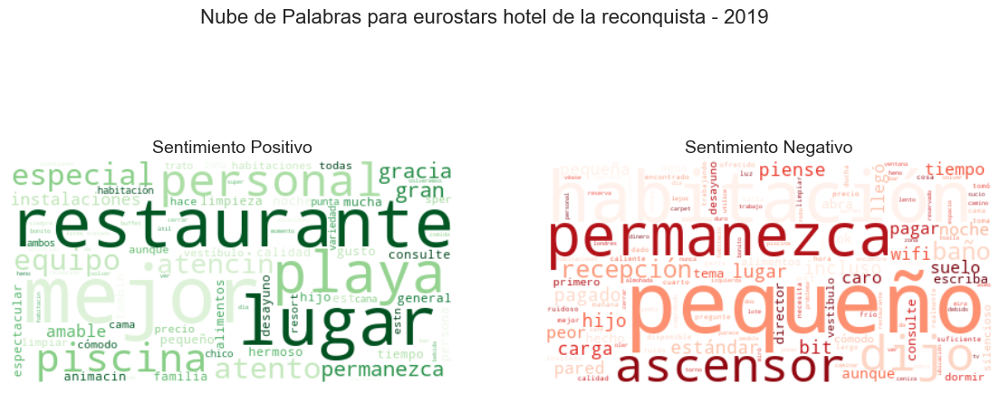

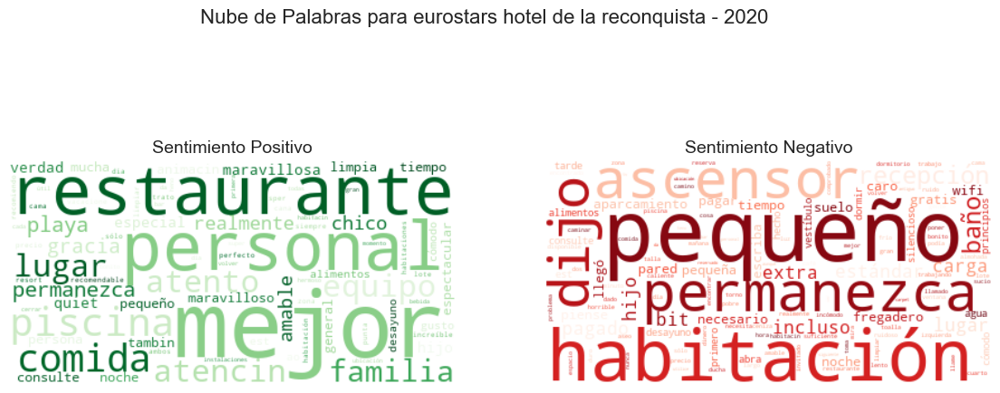

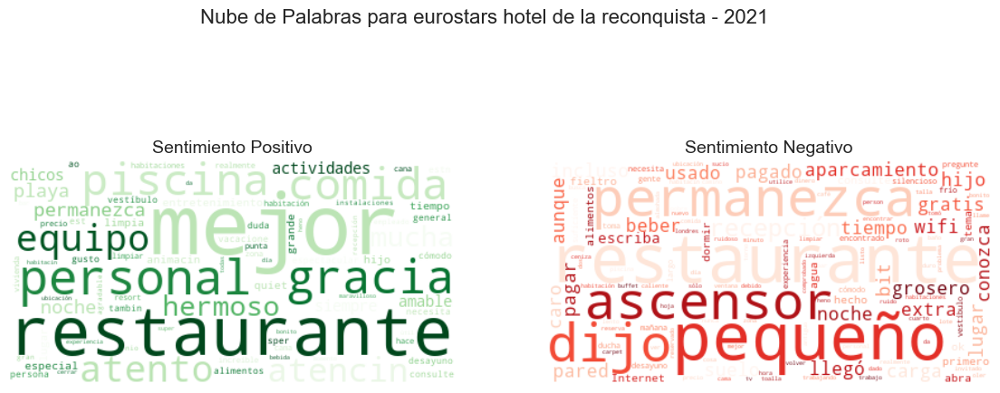

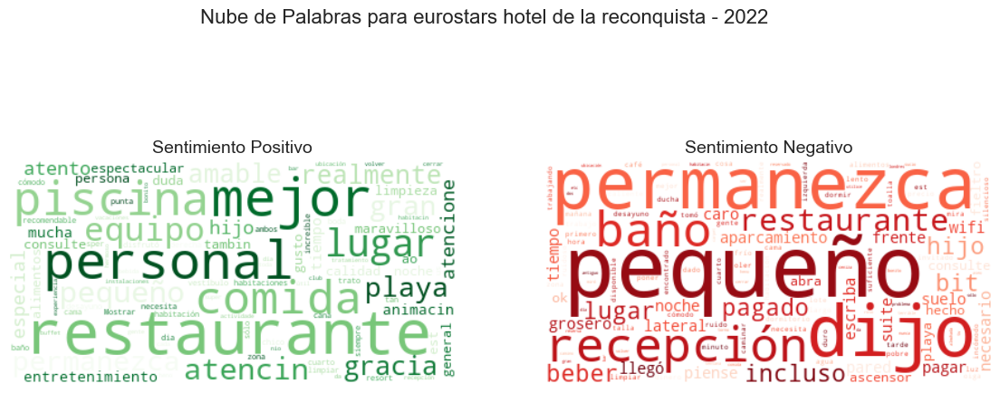

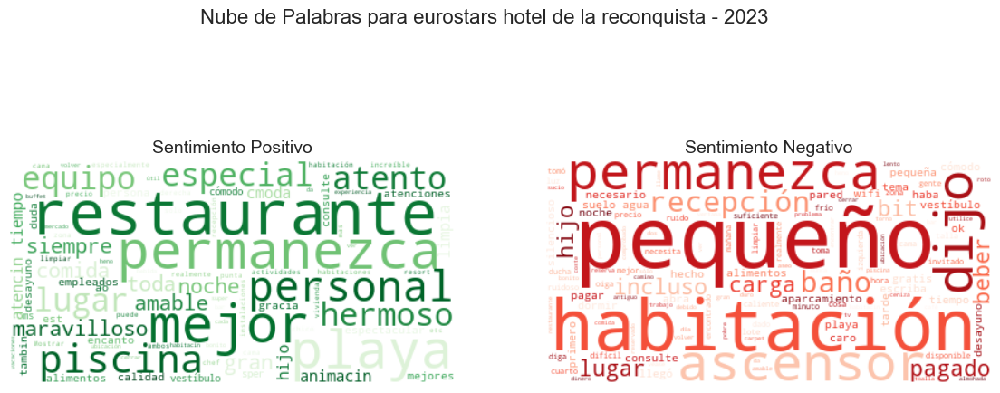

...

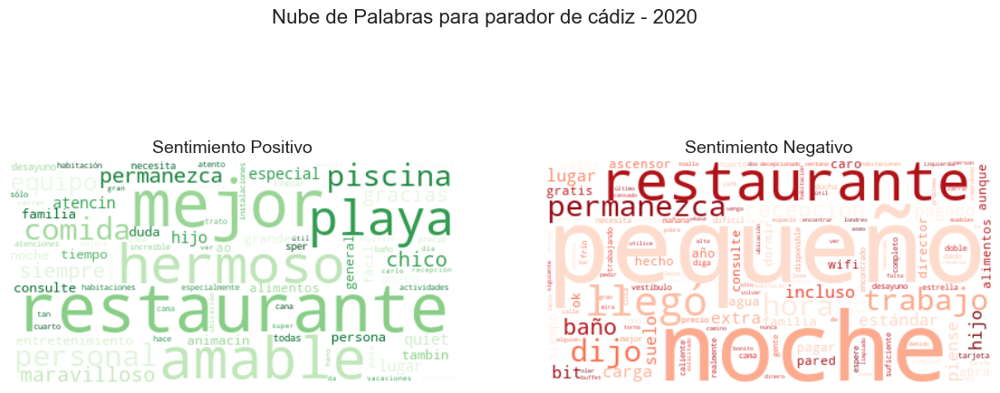

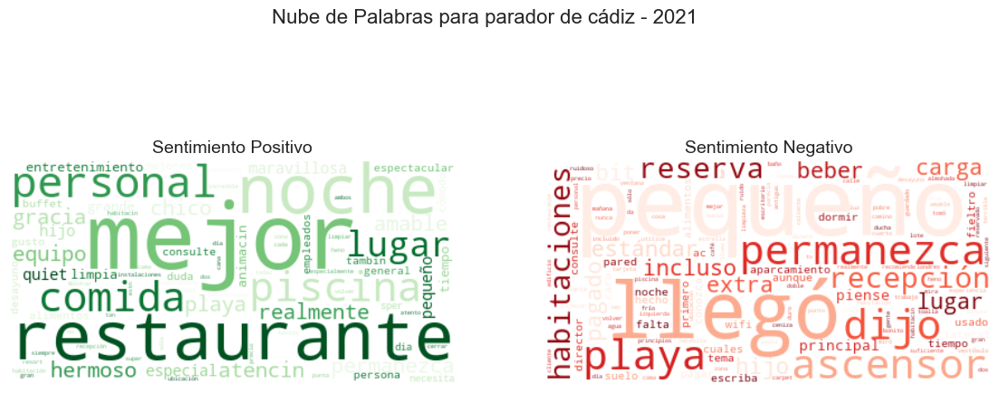

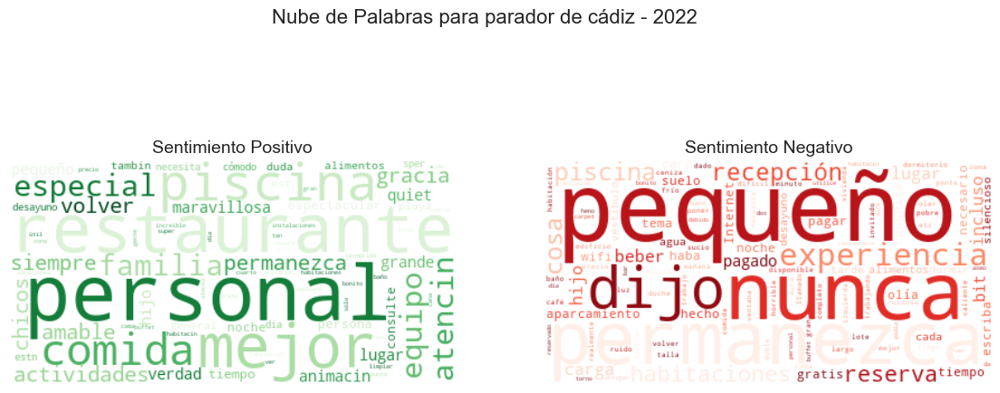

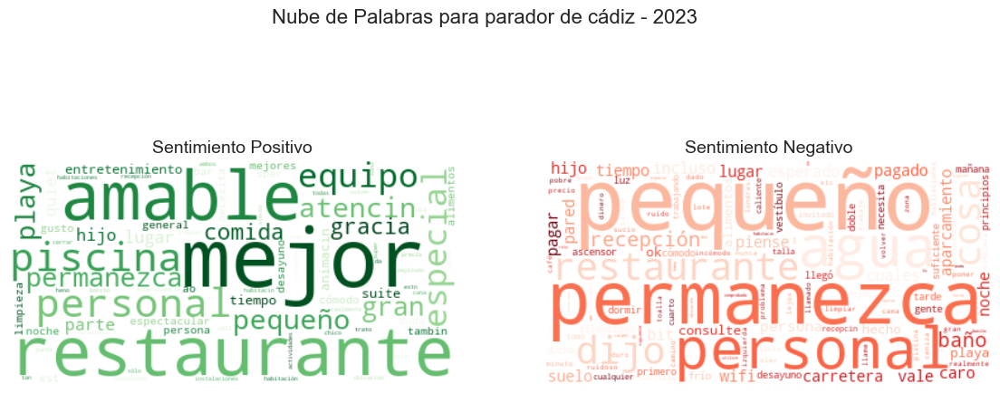

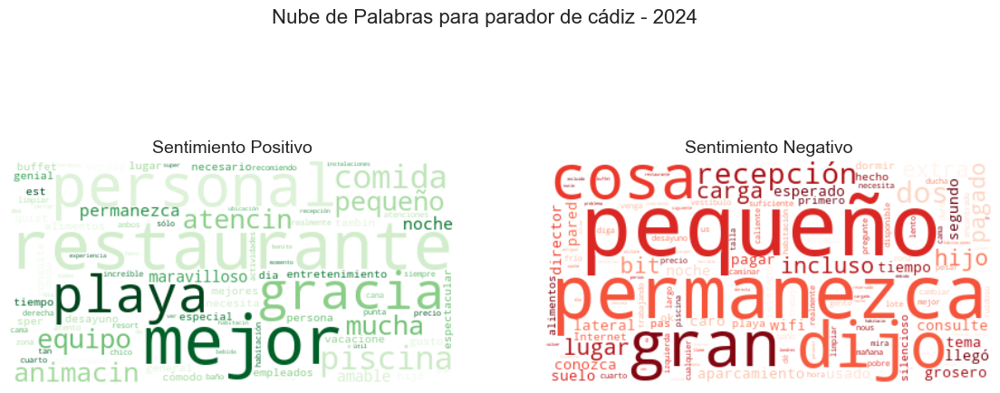

In [47]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def procesar_y_graficar(df_group, hotel, year):
    textos_positivos = df_group[df_group['review_sentiment'] == 'positive']['review_text']
    textos_negativos = df_group[df_group['review_sentiment'] == 'negative']['review_text']

    if textos_positivos.empty and textos_negativos.empty:
        print(f"No hay datos para {hotel} año {year}")
        return

    def preparar_texto_para_nube(textos):
        if textos.empty:
            return ""

        # Extraer palabras únicas con WordCloud (solo para sacar keys)
        wc_temp = WordCloud().generate(" ".join(textos))
        palabras_unicas = set(wc_temp.words_.keys())

        # Traducir palabras únicas
        traducciones = traducir_palabras_unicas(palabras_unicas, 'ES')

        # Limpiar con remove_stopwords y filtrar None o vacíos
        palabras_filtradas = [remove_stopwords(palabra) for palabra in traducciones.values()]
        palabras_filtradas = [p for p in palabras_filtradas if p and len(p) > 1]

        # Reconstruir texto limpio para la nube
        texto_limpio = " ".join(palabras_filtradas)
        return texto_limpio

    texto_positivo_limpio = preparar_texto_para_nube(textos_positivos)
    texto_negativo_limpio = preparar_texto_para_nube(textos_negativos)

    # Crear nubes con texto limpio
    wc_pos = WordCloud(width=400, height=200, background_color='white', colormap='Greens').generate(texto_positivo_limpio) if texto_positivo_limpio else None
    wc_neg = WordCloud(width=400, height=200, background_color='white', colormap='Reds').generate(texto_negativo_limpio) if texto_negativo_limpio else None

    # Mostrar gráficos lado a lado
    fig, axs = plt.subplots(1, 2, figsize=(14,6))
    fig.suptitle(f'Nube de Palabras para {hotel} - {year}', fontsize=16)

    if wc_pos:
        axs[0].imshow(wc_pos, interpolation='bilinear')
        axs[0].set_title('Sentimiento Positivo', fontsize=14)
    else:
        axs[0].text(0.5, 0.5, 'No hay datos positivos', ha='center', va='center')
    axs[0].axis('off')

    if wc_neg:
        axs[1].imshow(wc_neg, interpolation='bilinear')
        axs[1].set_title('Sentimiento Negativo', fontsize=14)
    else:
        axs[1].text(0.5, 0.5, 'No hay datos negativos', ha='center', va='center')
    axs[1].axis('off')

    plt.show()

# Aplicar para cada grupo (hotel, año)
for (hotel, year), grupo in df_booking.groupby(['hotel', 'año']):
    procesar_y_graficar(grupo, hotel, year)


In [48]:

# Limpiar textos sin traducir aún y separar por sentimiento
textos_limpios_positivos = df_hotel_cadiz[df_hotel_cadiz['sentiment'] == 'positive']['text']
textos_limpios_negativos = df_hotel_cadiz[df_hotel_cadiz['sentiment'] == 'negative']['text']

# Sacar las palabras de las nubes de palabras
wordcloud_positiva = WordCloud().generate(" ".join(textos_limpios_positivos))
wordcloud_negativa = WordCloud().generate(" ".join(textos_limpios_negativos))

palabras_nube_positivas = set(wordcloud_positiva.words_.keys())
palabras_nube_negativas = set(wordcloud_negativa.words_.keys())

print(f'Palabras únicas en nube positiva: {palabras_nube_positivas}')
print(f'Palabras únicas en nube negativa: {palabras_nube_negativas}')

# Traducir palabras únicas primero
palabras_traducidas_positivas = traducir_palabras_unicas(palabras_nube_positivas, 'ES')
palabras_traducidas_negativas = traducir_palabras_unicas(palabras_nube_negativas, 'ES')

# Aplicar remove_stopwords después de traducir
palabras_positivas = [remove_stopwords(p) for p in palabras_traducidas_positivas.values()]
palabras_negativas = [remove_stopwords(p) for p in palabras_traducidas_negativas.values()]

print(f'Palabras traducidas y filtradas en nube positiva: {len(palabras_positivas)}')
print(f'Palabras traducidas y filtradas en nube negativa: {len(palabras_negativas)}')

Palabras únicas en nube positiva: {'del personal', 'las piscina', 'especialmente', 'bathroom', 'que e', 'las actividades', 'las atencione', 'atencin de', 'excelente la', 'la mejor', 'de lo', 'solo', 'increble', 'muy buen', 'y', 'resort', 'best', 'bed', 'night', 'amable y', 'que se', 'le', 'en el', 'como', 'location', 'way', 'de la', 'really', 'con el', 'staff', 'm', 'del hotel', 'todo lo', 'punta cana', 'mi familia', 'muy buena', 'es un', 'un poco', 'de entretenimiento', 'muy amable', 'la habitacin', 'son muy', 'super', 'de primera', 'el buffet', 'y de', 'porque', 'good', 'el restaurante', 'equipo de', 'fue muy', 'u', 'personal muy', 'y la', 'este hotel', 'por la', 'lo mejor', 'price', 'donde', 'need', 'da', 'comida y', 'front desk', 'muchas gracias', 'un lugar', 'todas la', 'clean', 'place', 'el servicio', 'el personal', 'espectacular', 'que nos', 'en familia', 'uno de', 'comida e', 'y su', 'con una', 'small', 'en especial', 'con lo', 'con su', 'de animacin', 'es excelente', 'por el',

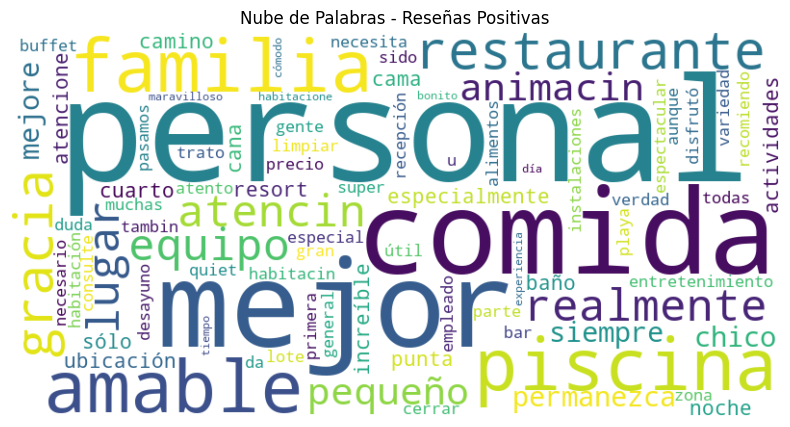

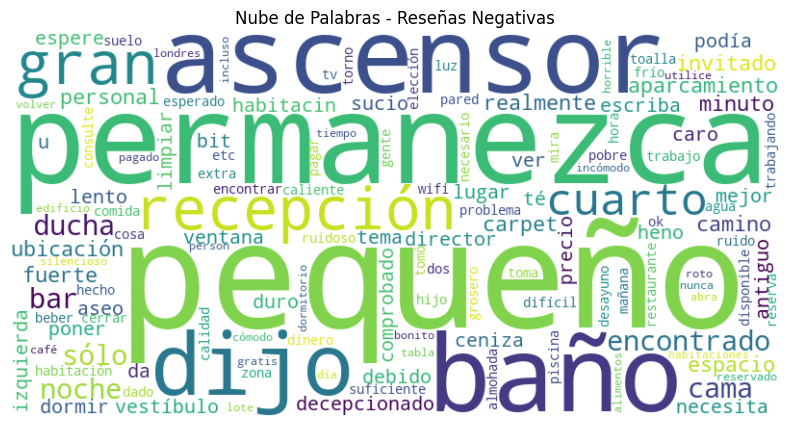

In [49]:

# Crear una nube de palabras para las reseñas palabras_traducidas_positivas
def crear_nube_palabras(textos, titulo):
    texto_completo = " ".join(textos)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(texto_completo)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(titulo)
    plt.show()

crear_nube_palabras(palabras_positivas, 'Nube de Palabras - Reseñas Positivas')
crear_nube_palabras(palabras_negativas, 'Nube de Palabras - Reseñas Negativas')



## Fraccionar las reviews
En esta sección, dividiremos todas las reviews en 5 bloques: uno con preferencia por sentimientos positivos, otro por negativos y los tres restantes contendrán opiniones variadas. Esto permitirá analizar el comportamiento y las características de cada grupo de reseñas según su polaridad y diversidad.


In [42]:
import pandas as pd

# Limpieza de sentiment
df_review['sentiment'] = df_review['sentiment'].str.strip().str.lower()

# Filtrar positivas y negativas
reviews_positivas = df_review[df_review['sentiment'] == 'positive'].sample(frac=1, random_state=42).reset_index(drop=True)
reviews_negativas = df_review[df_review['sentiment'] == 'negative'].sample(frac=1, random_state=42).reset_index(drop=True)


n_pos = len(reviews_positivas)
n_neg = len(reviews_negativas)

# Negativas
neg_half = n_neg // 2
neg_rest = n_neg - neg_half  # el resto que se repartirá en otros bloques

# Positivas
pos_half = n_pos // 2
pos_rest = n_pos - pos_half  # resto para repartir

# --- BLOQUE 2: 50% negativas (directo) + parte de positivas repartidas ---
bloque_2_neg = reviews_negativas.iloc[:neg_half]
# Positivas que van aquí: una tercera parte del resto de positivas (arbitrario, para repartir en 3 bloques)
pos_a_b2 = reviews_positivas.iloc[:pos_rest // 3]

bloque_2 = pd.concat([bloque_2_neg, pos_a_b2]).sample(frac=1, random_state=2).reset_index(drop=True)

# --- BLOQUE 1: 50% positivas (directo) + parte de negativas repartidas ---
bloque_1_pos = reviews_positivas.iloc[:pos_half]
# Negativas que van aquí: una tercera parte del resto de negativas
neg_a_b1 = reviews_negativas.iloc[neg_half:neg_half + neg_rest // 3]

bloque_1 = pd.concat([bloque_1_pos, neg_a_b1]).sample(frac=1, random_state=1).reset_index(drop=True)

# --- RESTO para random_1 y random_2 ---

# Positivas que quedan para random_1 y random_2
pos_restantes = reviews_positivas.iloc[pos_rest // 3:]
# Negativas que quedan para random_1 y random_2
neg_restantes = reviews_negativas.iloc[neg_half + neg_rest // 3:]

resto = pd.concat([pos_restantes, neg_restantes]).sample(frac=1, random_state=3).reset_index(drop=True)

# Dividir resto en dos para random_1 y random_2
n_resto = len(resto) // 2
bloque_3 = resto.iloc[:n_resto].reset_index(drop=True)
bloque_4 = resto.iloc[n_resto:].reset_index(drop=True)

# Diccionario final con bloques
bloques_reviews = {
    '80p_positivas': bloque_1,
    '80p_negativas': bloque_2,
    'random_1': bloque_3,
    'random_2': bloque_4,
}

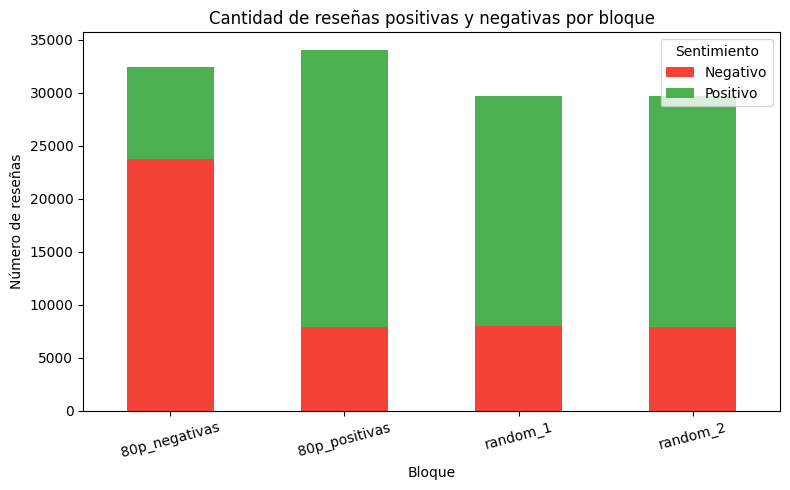

In [43]:
import matplotlib.pyplot as plt

# Crear DataFrame resumen con conteos por bloque y sentimiento
data = []

for nombre, df in bloques_reviews.items():
    pos_count = (df['sentiment'] == 'positive').sum()
    neg_count = (df['sentiment'] == 'negative').sum()
    data.append({'Bloque': nombre, 'Sentimiento': 'Positivo', 'Cantidad': pos_count})
    data.append({'Bloque': nombre, 'Sentimiento': 'Negativo', 'Cantidad': neg_count})

df_summary = pd.DataFrame(data)

# Pivotar para gráfico apilado
pivot_df = df_summary.pivot(index='Bloque', columns='Sentimiento', values='Cantidad').fillna(0)

# Graficar barras apiladas
pivot_df.plot(kind='bar', stacked=True, figsize=(8,5), color=['#F44336', '#4CAF50'])

plt.title('Cantidad de reseñas positivas y negativas por bloque')
plt.xlabel('Bloque')
plt.ylabel('Número de reseñas')
plt.xticks(rotation=15)
plt.legend(title='Sentimiento')
plt.tight_layout()
plt.show()


# HOTEL: Eurostar Hotel de la Reconquista





In [45]:
# Unir los DataFrames de Hotel y Reviews segun la cantidad de reseñas que tiene cada hotel

# Reseñas del Hotel: Parador de Cadiz
df_hotel_cadiz = df_hotel[df_hotel['hotel'].str.lower() == 'eurostars hotel de la reconquista']
total_booking = len(df_hotel_cadiz)

# Del total de reservas, coger la misma cantidad de reseñas, donde el 80% sean positivas y el 20% negativas, todas sacadas de df_reviews
df_reviews_positive = df_review[df_review['sentiment'] == 'positive']
df_reviews_negative = df_review[df_review['sentiment'] == 'negative']

total_positive = int(total_booking * 0.2)
total_negative = total_booking - total_positive
df_reviews_positive = df_reviews_positive.sample(n=total_positive, random_state=42)
df_reviews_negative = df_reviews_negative.sample(n=total_negative, random_state=42)

# Unir los DataFrames de Reviews
df_reviews_cadiz = pd.concat([df_reviews_positive, df_reviews_negative], ignore_index=True)

df_final_asturias = pd.concat([df_hotel_cadiz.reset_index(drop=True), df_reviews_cadiz.reset_index(drop=True)], axis=1)
df_final_asturias.head()


,hotel,cancelado,regimen,canal_distribucion,tipo_cliente,cliente_recurrente,reservas_previas_no_canceladas,adultos,ninos,hombres,...,plazas_aparcamiento,ubicación,campaña_asignada,lanzamiento_inicio,lanzamiento_fin,fecha_inicio,fecha_fin,tiene_campaña,text,sentiment


C:\Users\Alumno_AI\AppData\Local\Temp\ipykernel_21160\3621470625.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_final_asturias, x='sentiment', palette='Set2')


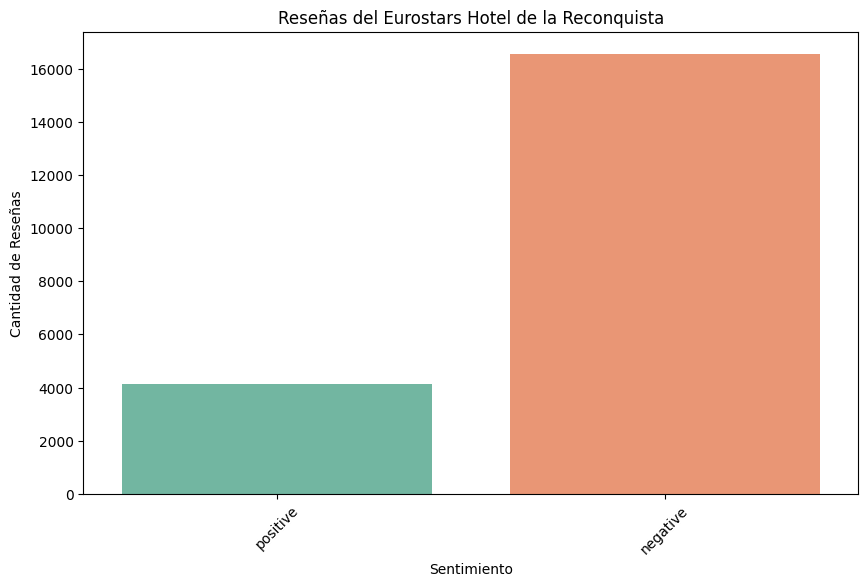

In [78]:
# Gráfica para ver las reseñas positivas y negativas de df_hotel_cadiz
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 6))
sns.countplot(data=df_final_asturias, x='sentiment', palette='Set2')
plt.title('Reseñas del Eurostars Hotel de la Reconquista')
plt.xlabel('Sentimiento')
plt.ylabel('Cantidad de Reseñas')
plt.xticks(rotation=45)
plt.show()

In [79]:

# Limpiar textos sin traducir aún y separar por sentimiento
textos_limpios_positivos = df_final_asturias[df_final_asturias['sentiment'] == 'positive']['text'].apply(remove_stopwords)
textos_limpios_negativos = df_final_asturias[df_final_asturias['sentiment'] == 'negative']['text'].apply(remove_stopwords)

# Sacar las palabras de las nubes de palabras
wordcloud_positiva = WordCloud().generate(" ".join(textos_limpios_positivos))
wordcloud_negativa = WordCloud().generate(" ".join(textos_limpios_negativos))
palabras_nube_positivas = set(wordcloud_positiva.words_.keys())
palabras_nube_negativas = set(wordcloud_negativa.words_.keys())
print(f'Palabras únicas en nube positiva: {len(palabras_nube_positivas)}')
print(f'Palabras únicas en nube negativa: {len(palabras_nube_negativas)}')

# Traducir palabras únicas
palabras_traducidas_positivas = traducir_palabras_unicas(palabras_nube_positivas, 'es')
palabras_traducidas_negativas = traducir_palabras_unicas(palabras_nube_negativas, 'es')

print(f'Palabras traducidas en nube positiva: {palabras_traducidas_positivas}')
print(f'Palabras traducidas en nube negativa: {palabras_traducidas_negativas}')


Palabras únicas en nube positiva: 200
Palabras únicas en nube negativa: 200
Palabras traducidas en nube positiva: {'people': 'gente', 'dos': 'dos', 'recepcin': 'recepcin', 'tambin': 'tambin', 'recomendado': 'recomendado', 'personal amable': 'personal amable', 'stayed': 'permanezca en', 'atencin': 'atencin', 'always': 'siempre', 'hace': 'hace', 'tambien': 'tambien', 'servicio': 'servicio', 'recomiendo': 'recomiendo', 'chef': 'chef', 'gente': 'gente', 'hermosa': 'hermoso', 'best': 'mejor', 'buen': 'buen', 'buena comida': 'buena comida', 'atento': 'atento', 'trago': 'trago', 'hermoso': 'hermoso', 'encanto': 'encanto', 'great': 'gran', 'location': 'ubicación', 'verdad': 'verdad', 'agradable': 'agradable', 'duda': 'duda', 'price': 'precio', 'hora': 'hora', 'view': 'ver', 'way': 'camino', 'limpieza': 'limpieza', 'wonderful': 'maravilloso', 'hoteles': 'hoteles', 'piscina': 'piscina', 'amazing': 'increíble', 'chico': 'chico', 'restaurante': 'restaurante', 'check': 'consulte', 'limpia': 'limpia

palabras: gente dos recepcin tambin recomendado personal amable permanezca atencin siempre hace tambien  recomiendo chef gente hermoso mejor  comida atento trago hermoso encanto gran ubicación verdad agradable duda precio hora ver camino limpieza maravilloso hoteles piscina increíble chico restaurante consulte limpia bonito amado dia ráfaga ms cliente tiempo realmente linda  vivienda empleado mejore gracia gusto  semana chica cómodo tratado da personal equipo mucha cerrar toda bonito amabilidad limpiar Mostrar pequeño  hacen estn piscina comida  genial gratis vacacione etc equipo animacin complejo comida recepción atenciones aunque cuarto baño noche pieza recomendable general mas primera maravillosa general día siempre limpio cómodo limpio buenos amigo  grande animadores noche amable servicial cama lindo increíble pasamo carlo actividades resort cosa necesario sido volver spa lugar hicieron restaurante experiencia bebida quiet camarero desayuno mayordomo gran trabajo mejor estancia hab

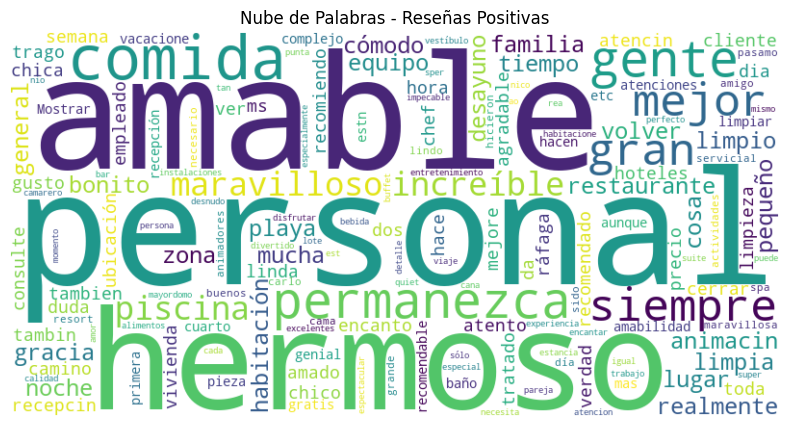

palabras: bit gente poner primero mejor permanezca siempre coste  aparcamiento carga habitación pequeña beber ascensor recepción gran ubicación espere  nunca dormitorio permanezca baño llamado piense roto londres suelo precio ver camino  mira piscina aseo sucio consulte reservado restaurante aunque pobre horrible ayuda  mañana cualquier cosa problema ms tiempo realmente disponible véase vivienda diga  cómodo hoteles da person personal lento cerrar incluso dejar oler bonito utilice pequeño limpiar  fuerte piscina trabajando antiguo fieltro teléfono calidad tv etc encontrar miró comida  recepción duro ruidoso encontrado pagado alguien cuarto baño noche habitaciones  decepcionado ruido general día usado aunque extra abra noche  cama almohada minuto toma izquierda dormir  necesario tabla experiencia dio gran lugar restaurante  espacio carpet dos  reserva haba alta habitación lejos llegó grosero buffet ok comprobado  sólo debido permanezca ascensor zona ceniza est desayuno conozca silencios

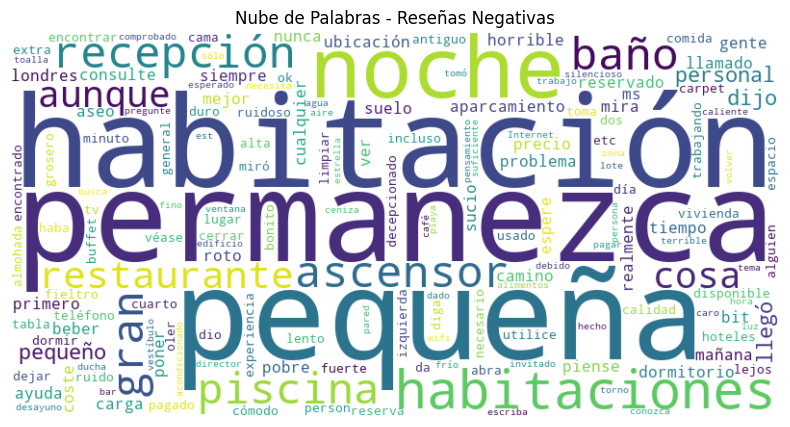

In [98]:
palabras_positivas = list(palabras_traducidas_positivas.values())
palabras_negativas = list(palabras_traducidas_negativas.values())

# Crear una nube de palabras para las reseñas palabras_traducidas_positivas
def crear_nube_palabras(textos, titulo):
    texto_completo = " ".join(textos)
    print("palabras:", texto_completo)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(texto_completo)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(titulo)
    plt.show()

# Las palabras ya están filtradas y traducidas, solo hay que unirlas en un string
palabras_positivas_filtradas = [remove_stopwords(p) for p in palabras_positivas]
palabras_negativas_filtradas = [remove_stopwords(p) for p in palabras_negativas]

crear_nube_palabras(palabras_positivas_filtradas, 'Nube de Palabras - Reseñas Positivas')
crear_nube_palabras(palabras_negativas_filtradas, 'Nube de Palabras - Reseñas Negativas')